In [21]:
%config InlineBackend.figure_formats = ['svg']
import json
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from gerrychain import Graph

In [7]:
def multi_scale_contract(G, mods):
  G_fused = G.copy()
  for x, y in G.nodes:
    G_fused.nodes[(x, y)]['contains'] = [(x, y)]
  for x, y in G.nodes:
    for ((x_min, x_max), (y_min, y_max)), bm in mods.items():
      if x_min <= x <= x_max and y_min <= y <= y_max:
        if x % bm != bm // 2 or y % bm != bm // 2:
          pop = G_fused.nodes[(x, y)]['population']
          mid_node = (bm * (x // bm) + bm // 2, bm * (y // bm) + bm // 2)
          G_fused.nodes[mid_node]['population'] += pop
          G_fused.nodes[mid_node]['contains'] += G_fused.nodes[(x, y)]['contains']
          nx.contracted_nodes(G_fused, mid_node, (x, y), copy=False)
  return G_fused

In [8]:
def multi_scale_plot(G, pop_scale=15, ax=None):
  pos = {n: n for n in G.nodes}
  node_size = [pop_scale * G.nodes[n]['population'] for n in G]
  node_color = [G.nodes[n]['district'] for n in G]
  if ax:
    nx.draw(G, pos=pos, node_size=node_size, node_color=node_color, ax=ax)
  else:
    nx.draw(G, pos=pos, node_size=node_size, node_color=node_color)

In [9]:
def multi_scale_save(G, path):
  G_reindexed = nx.relabel_nodes(G.copy(), {n: idx for idx, n in enumerate(G)})
  with open(path, 'w') as f:
    data = nx.json_graph.adjacency_data(G_reindexed)
    for node in data['nodes']:
      if 'contraction' in node:
        del node['contraction']
    json.dump(data, f)

Fuse 64x16 grid into:
- 2x2: [0, 15] x [0, 15] (so mod 8)
- 4x4: [0, 15] x [16, 31] (so mod 4)
- 8x8: [16, 31] x [0, 15] (so mod 2)
- 16x16: [16, 31] x [16, 31]

In [10]:
G_32x32 = nx.grid_graph(dim=[32, 32])
for node in G_32x32.nodes:
  G_32x32.nodes[node]['population'] = 1
  G_32x32.nodes[node]['district'] = (2 * (node[0] // 16)) + (node[1] // 16) + 1

mods_32x32 = {
  ((0, 15), (0, 15)): 1,
  ((0, 15), (16, 31)): 2,
  ((16, 31), (0, 15)): 4,
  ((16, 31), (16, 31)): 8
}

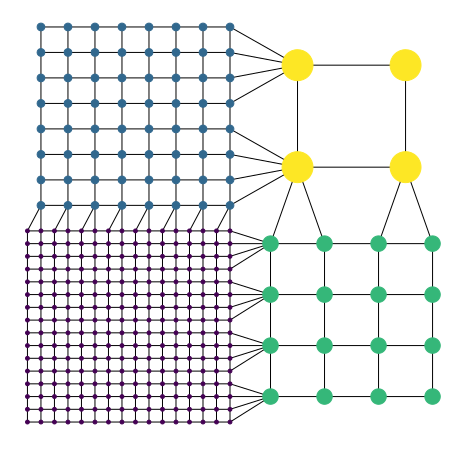

In [11]:
_, ax = plt.subplots(figsize=(8, 8))
G_32x32_fused = multi_scale_contract(G_32x32, mods_32x32)
multi_scale_plot(G_32x32_fused, ax=ax)
multi_scale_save(G_32x32_fused, 'pathological_grid_graphs/32x32.json')

In [14]:
G_128x192 = nx.grid_graph(dim=[128, 192])
for node in G_128x192.nodes:
  G_128x192.nodes[node]['population'] = 1
  G_128x192.nodes[node]['district'] = (2 * (node[0] // 64)) + (node[1] // 64) + 1

mods_128x192 = {
  ((0, 63), (0, 63)): 1,
  ((0, 63), (64, 128)): 2,
  ((64, 127), (0, 63)): 4,
  ((64, 127), (64, 128)): 8,
  ((128, 191), (0, 63)): 16,
  ((128, 191), (64, 128)): 32,
}

In [15]:
_, ax = plt.subplots(figsize=(12, 8))
G_128x192_fused = multi_scale_contract(G_128x192, mods_128x192)
multi_scale_plot(G_128x192_fused, ax=ax, pop_scale=2)
multi_scale_save(G_128x192_fused, 'pathological_grid_graphs/128x192.json')

Fuse 64x16 grid into:
- 2x2: [0, 15] x [0, 15] (so mod 8)
- 4x4: [16, 31] x [0, 15] (so mod 4)
- 8x8: [32, 47] x [0, 15] (so mod 2)
- 16x16: [48, 63] x [0, 15]

In [16]:
def horizontal_exp_strip(n, fig_scale=3, pop_scale=15, path=None):
  height = 2**n
  width = n * height
  G = nx.grid_graph(dim=[height, width])
  for node in G.nodes:
    G.nodes[node]['population'] = 1
    G.nodes[node]['district'] = 1 + (node[0] // height)
  mods = {
    ((height * k, (height * (k + 1)) - 1), (0, height - 1)): 2**k
    for k in range(n)
  } 
  G_fused = multi_scale_contract(G, mods)
  fig, ax = plt.subplots(figsize=(n * fig_scale, fig_scale))
  multi_scale_plot(G_fused, pop_scale=pop_scale, ax=ax)
  plt.plot()
  plt.show()
  plt.close(fig)
  if path:
    multi_scale_save(G_fused, path)
  return G_fused

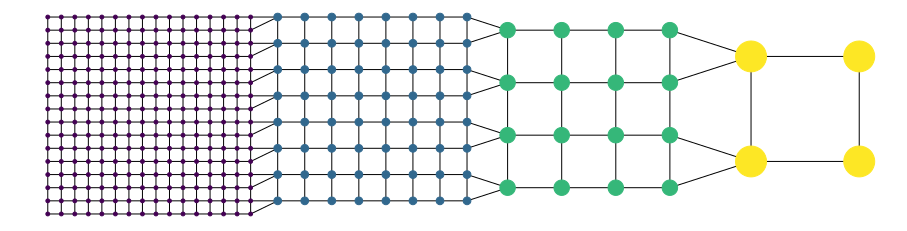

In [17]:
horizontal_exp_strip(4, path='pathological_grid_graphs/64x16.json', fig_scale=4)

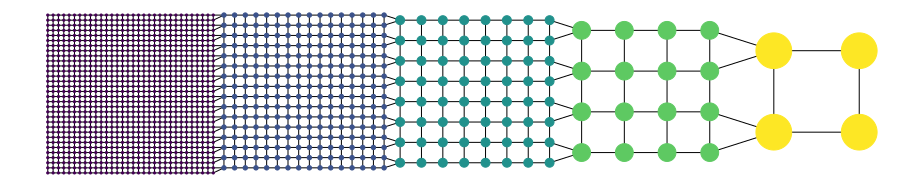

In [18]:
horizontal_exp_strip(5, path='pathological_grid_graphs/160x32.json', pop_scale=5, fig_scale=3.2)

In [19]:
horizontal_exp_strip(6, path='pathological_grid_graphs/384x64.json', pop_scale=1.5, fig_scale=2.7)

In [30]:
with open('32x32_flips.json') as f:
  flips = json.load(f)['flips']
pixels = np.zeros((32, 32), dtype=int)
for idx, node in enumerate(G_32x32_fused.nodes):
  for x, y in G_32x32_fused.nodes[node]['contains']:
    pixels[31 - x, y] = flips[idx]

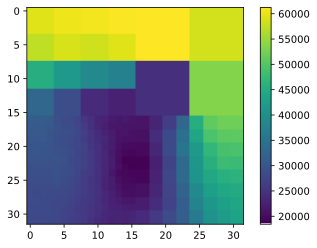

In [36]:
plt.imshow(pixels)
plt.colorbar()
plt.show()